# Подготовка

In [1]:
# !python3 -m pip install --upgrade pip
# !python3 -m pip install --upgrade Pillow==9.0.0

In [2]:
import PIL
from PIL import Image
import numpy as np

In [3]:
# Исходное изображение взято из: https://artsexperiments.withgoogle.com/timelines#/glacier/rhoneglacier.

!wget -O rhoneglacier-1880.png https://raw.githubusercontent.com/gereltuya/aiac-tasks/main/task1/rhoneglacier-1880.png

--2023-03-09 10:39:37--  https://raw.githubusercontent.com/gereltuya/aiac-tasks/main/task1/rhoneglacier-1880.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3036255 (2.9M) [image/png]
Saving to: ‘rhoneglacier-1880.png’

rhoneglacier-1880.p 100%[===================>]   2.90M  --.-KB/s    in 0.07s   

2023-03-09 10:39:37 (44.2 MB/s) - ‘rhoneglacier-1880.png’ saved [3036255/3036255]



In [4]:
with Image.open("rhoneglacier-1880.png") as img_org:
    img_bw = img_org.convert('1')
    img_bw.save('rhoneglacier-1880-bw.png')

### Пояснение к изображению

Ледник Рона — долинный ледник, расположенный в центральных швейцарских Альпах. Это исток одной из крупнейших рек Европы Роны.

Сотрудничая с Лабораторией гляциологии в ETH Zurich, Фабиан Офнер и его команда изучили данные об отступлении ледника.

Используя информацию с исторических карт в сочетании с высокотехнологичным мониторингом последних лет, лаборатория смогла визуализировать историческое расширение ледника за 150 лет.

В результате получился 2-метровый отпечаток, отображающий 140 лет ледниковой истории на одной фотографии.

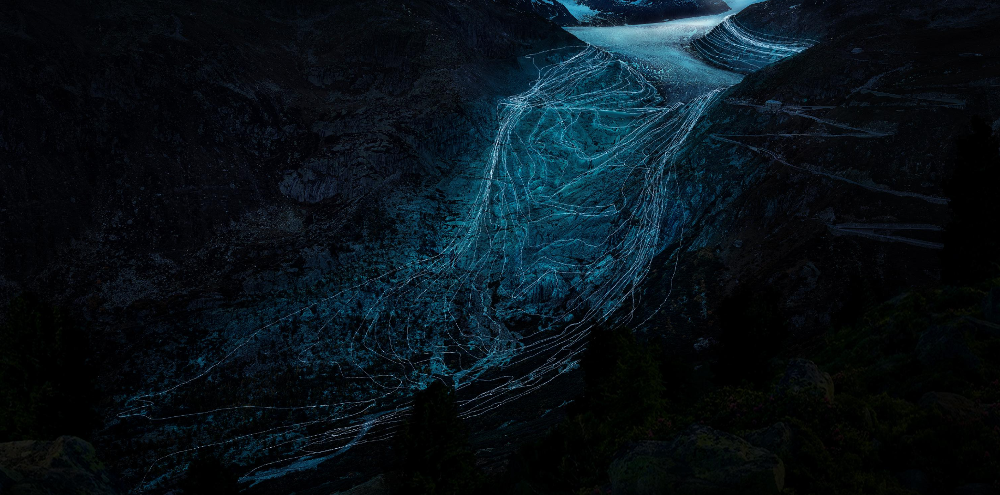

In [5]:
img_org

# Image Negatives

### Вопрос: Можем ли мы более четко увидеть исторические линии ледников?

In [6]:
def trans_neg(img_in):
    img_out = img_in.copy()
    width, height = img_out.size
    
    for x in range(width):
        for y in range(height):
            pix_col = img_out.getpixel((x,y))
            
            # s = L - 1 - r
            # (Formula 3.2-1)
            if type(pix_col) == tuple:
                pix_red = 256-1-pix_col[0]
                pix_green = 256-1-pix_col[1]
                pix_blue = 256-1-pix_col[2]
                
                img_out.putpixel((x,y), (pix_red,pix_green,pix_blue))
           
            else:
                pix_col = 256-1-pix_col
                img_out.putpixel((x,y),pix_col)
    
    return img_out

In [7]:
with Image.open("rhoneglacier-1880-bw.png") as img:
    img_neg = trans_neg(img)

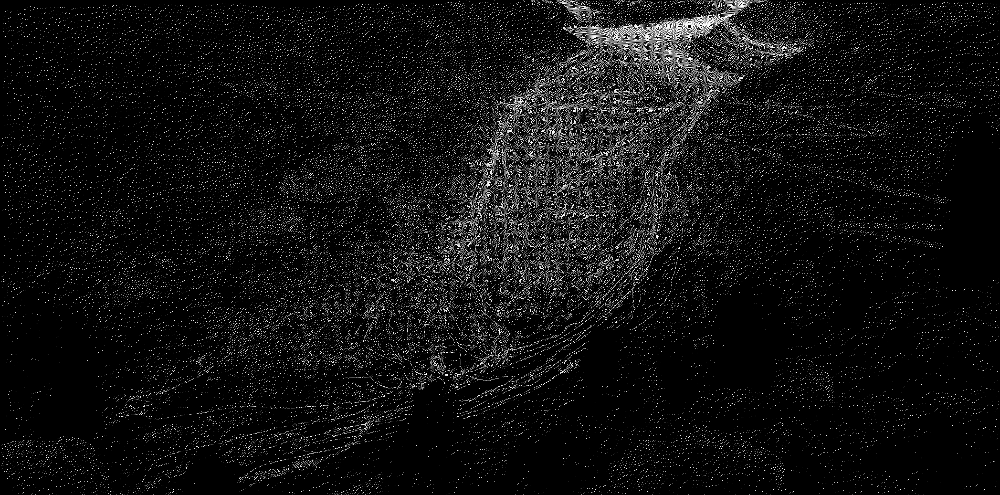

In [8]:
img

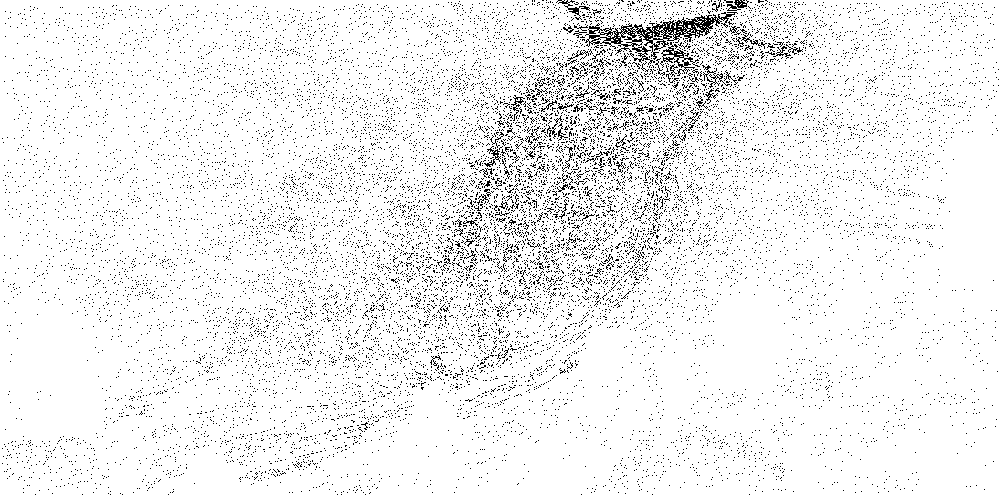

In [9]:
img_neg

# Log Transformations

### Вопрос: Можем ли мы увидеть более широкое распространение интенсивности изображения?

In [10]:
def trans_log(img_in):
    img_out = img_in.copy()
    c = 255/(np.log(1 + np.max(img_out)))
    width, height = img_out.size
    
    for x in range(width):
        for y in range(height):
            pix_col = img_out.getpixel((x,y))
            
            # s = c * log(1 + r)
            # Formula (3.2-2)
            if type(pix_col) == tuple:
                pix_red = int(c * np.log(1 + pix_col[0]))
                pix_green = int(c * np.log(1 + pix_col[1]))
                pix_blue = int(c * np.log(1 + pix_col[2]))
                
                img_out.putpixel((x,y), (pix_red,pix_green,pix_blue))
                           
            else:
                pix_tra = int(c * np.log(1 + pix_col))
                img_out.putpixel((x,y),pix_tra)
    
    return img_out

In [11]:
with Image.open("rhoneglacier-1880.png") as img:
    img_log = trans_log(img)

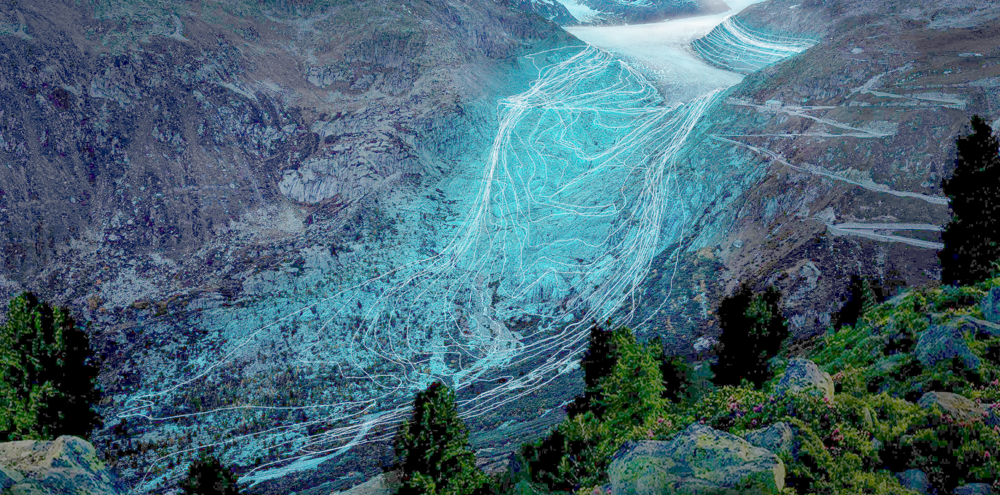

In [12]:
img_log

In [13]:
with Image.open("rhoneglacier-1880-bw.png") as img:
    img_log_bw = trans_log(img)

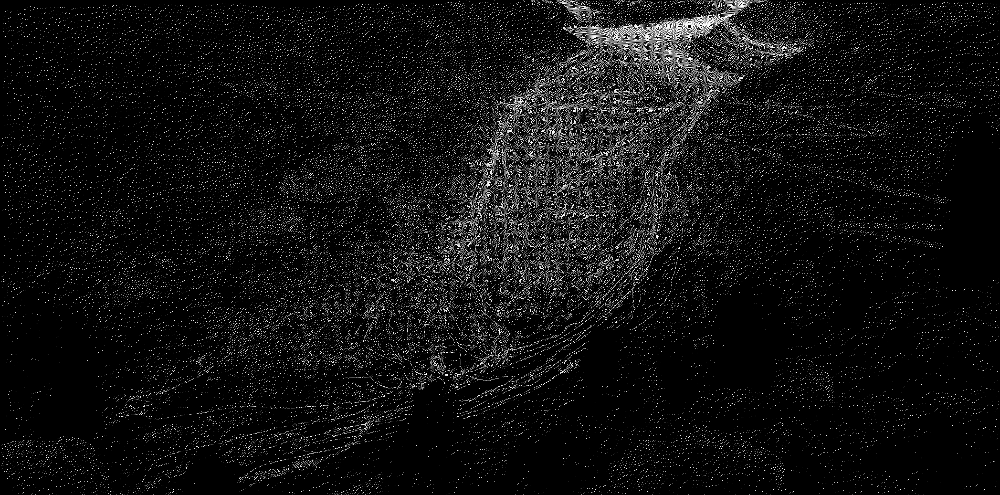

In [14]:
img_log_bw

# Power-Law (Gamma) Transformations

### Вопрос: Можем ли мы увидеть окружающую природу в более светлом свете?

In [35]:
def trans_gam(img_in):
    img_out = img_in.copy()
    c = 255/(np.log(1 + np.max(img_out)))
    g = 1.2
    width, height = img_out.size
    
    for x in range(width):
        for y in range(height):
            pix_col = img_out.getpixel((x,y))
            
            # s = c*r^g
            # Formula (3.2-3)
            if type(pix_col) == tuple:
                pix_red = int(c*255*(pix_col[0]/255)**g)
                pix_green = int(c*255*(pix_col[1]/255)**g)
                pix_blue = int(c*255*(pix_col[2]/255)**g)
                
                img_out.putpixel((x,y), (pix_red,pix_green,pix_blue))
                           
            else:
                pix_tra = int(c*255*(pix_col/255)**g)
                img_out.putpixel((x,y),pix_tra)
    
    return img_out

In [36]:
with Image.open("rhoneglacier-1880.png") as img:
    img_gam = trans_gam(img)

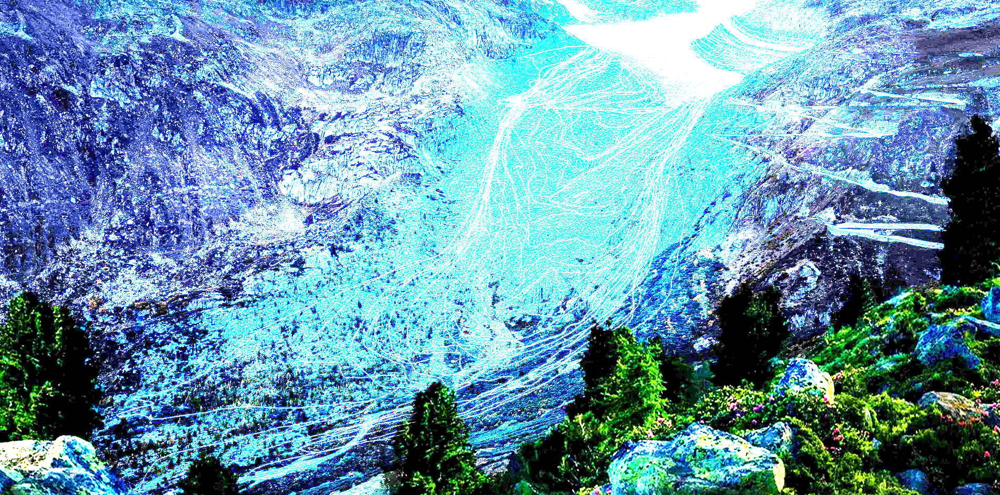

In [37]:
img_gam

In [38]:
with Image.open("rhoneglacier-1880-bw.png") as img:
    img_gam_bw = trans_gam(img)

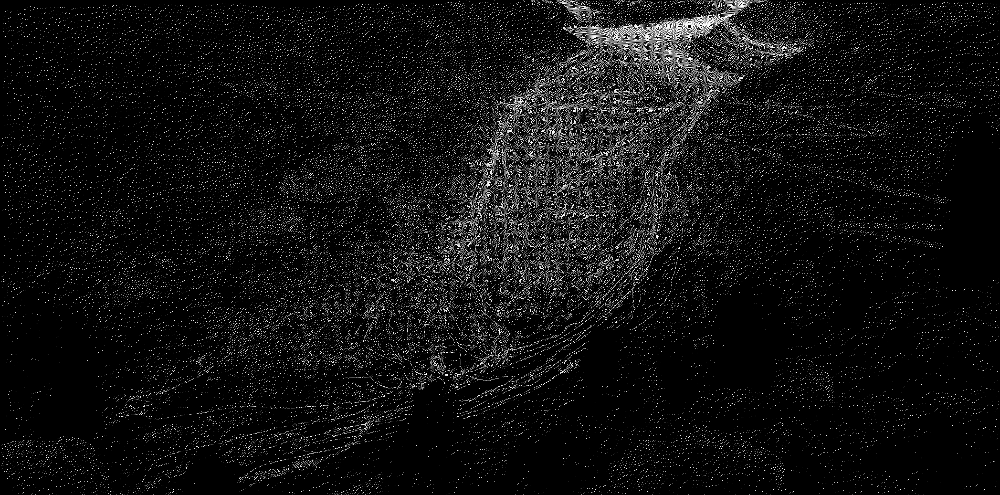

In [39]:
img_gam_bw

# Piecewise Linear Transformations: Contrast Stretching

### Вопрос: Можем ли мы увидеть изображение с большей контрастностью?

In [20]:
def trans_pwl_pix(pix, r1, s1, r2, s2):
    if (0 <= pix and pix <= r1):
        return (s1/r1)*pix
    elif (r1 < pix and pix <= r2):
        return ((s2-s1)/(r2-r1))*(pix-r1)+s1
    else:
        return ((255-s2)/(255-r2))*(pix-r2)+s2

def trans_pwl(img_in):
    img_out = img_in.copy()
    r1 = 60
    s1 = 0
    r2 = 150
    s2 = 255
    width, height = img_out.size
    
    for x in range(width):
        for y in range(height):
            pix_col = img_out.getpixel((x,y))
            
            if type(pix_col) == tuple:
                pix_red = int(trans_pwl_pix(pix_col[0], r1, s1, r2, s2))
                pix_green = int(trans_pwl_pix(pix_col[1], r1, s1, r2, s2))
                pix_blue = int(trans_pwl_pix(pix_col[2], r1, s1, r2, s2))
                
                img_out.putpixel((x,y), (pix_red,pix_green,pix_blue))
                           
            else:
                pix_tra = int(trans_pwl_pix(pix_col, r1, s1, r2, s2))
                img_out.putpixel((x,y),pix_tra)
    
    return img_out

In [21]:
with Image.open("rhoneglacier-1880.png") as img:
    img_pwl = trans_pwl(img)

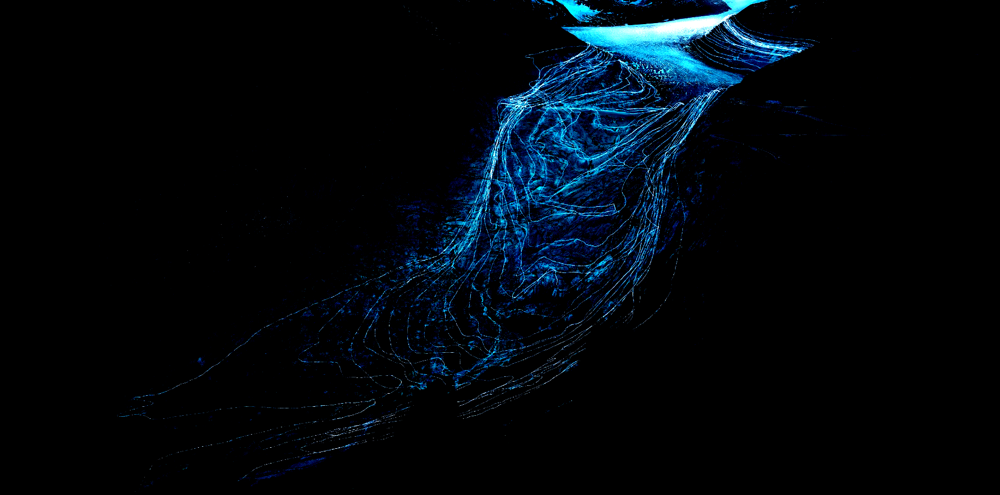

In [22]:
img_pwl

In [23]:
with Image.open("rhoneglacier-1880-bw.png") as img:
    img_pwl_bw = trans_pwl(img)

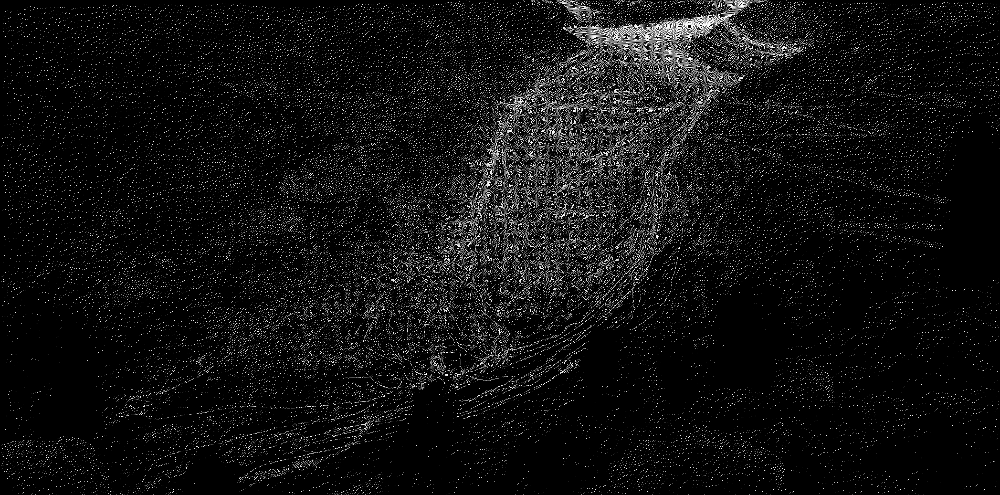

In [24]:
img_pwl_bw